In [2]:
from ultralytics import YOLO
import squarify
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns

sns.set_style('darkgrid')


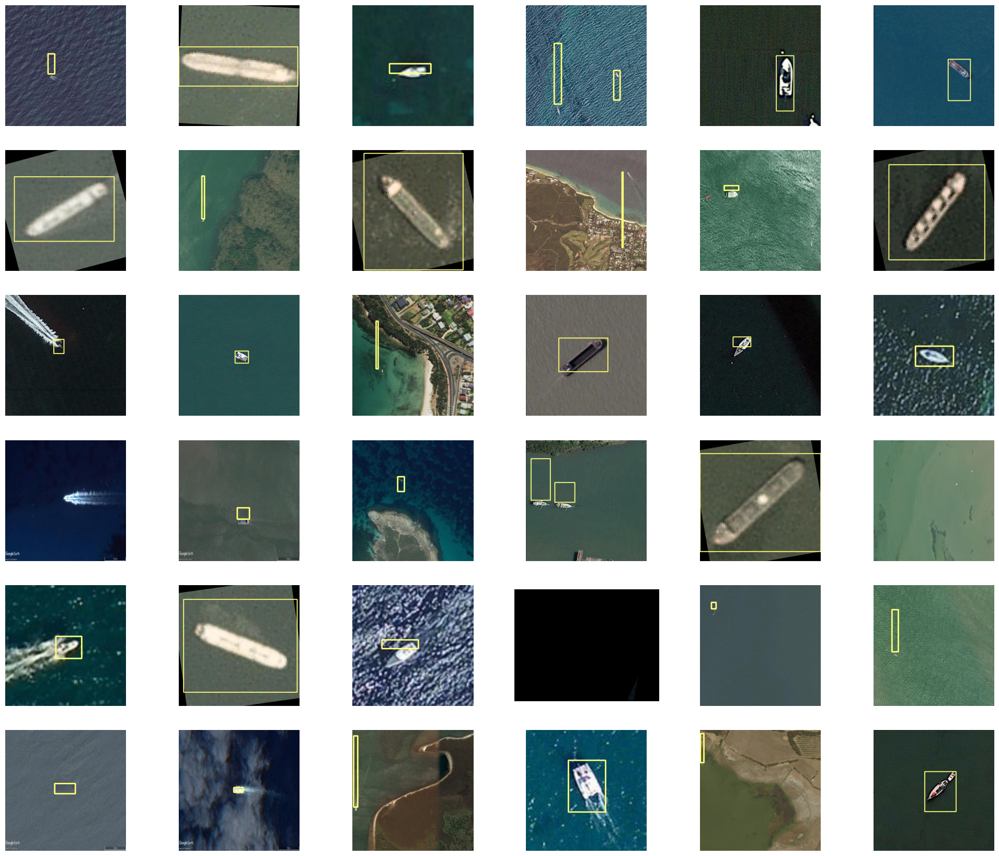

In [3]:
import os
import cv2
import random
import matplotlib.pyplot as plt

# 定義絕對路徑
base_path = r"D:\Code\anaconda\code\ship_yolo\ships-aerial-images"
train_images = os.path.join(base_path, "train/images")
train_labels = os.path.join(base_path, "train/labels")

test_images = os.path.join(base_path, "test/images")
test_labels = os.path.join(base_path, "test/labels")

val_images = os.path.join(base_path, "valid/images")
val_labels = os.path.join(base_path, "valid/labels")

# 讀取圖片檔案名
image_files = os.listdir(train_images)

# 隨機選取36張圖片
random_images = random.sample(image_files, 36)

# 建立圖片展示
fig, axs = plt.subplots(6, 6, figsize=(25, 21))
for i, image_file in enumerate(random_images):
    row = i // 6
    col = i % 6
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")
    for label in labels:
        if len(label.split()) != 5:
            continue
        class_id, x_center, y_center, width, height = map(float, label.split())
        x_min = int((x_center - width / 2) * image.shape[1])
        y_min = int((y_center - height / 2) * image.shape[0])
        x_max = int((x_center + width / 2) * image.shape[1])
        y_max = int((x_center + height / 2) * image.shape[0])
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (122, 255, 255), 3)

    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()


In [10]:
# 定義絕對路徑
image_path = r"D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\257b0cea8_jpg.rf.40d45ed9b991af77e6953e264f0bb2c2.jpg"

# 讀取影像
img = cv2.imread(image_path)

# 取得影像的維度
height, width, channels = img.shape

# 打印影像的維度
print(f"The image has dimensions {width}x{height} and {channels} channels.")


The image has dimensions 768x768 and 3 channels.


In [4]:
model_path = r"D:\Code\anaconda\code\ship_yolo\yolov8s.pt"
data_path = r"D:\Code\anaconda\code\ship_yolo\ships-aerial-images\data.yaml"

# 初始化模型
model = YOLO(model_path)

# 訓練模型
model.train(data=data_path,
            epochs=15,
            imgsz=762,
            seed=42,
            batch=16,
            workers=6)


d:\anaconda\Lib\site-packages\ultralytics\nn\tasks.py:733: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(file, map_location="cpu")


New https://pypi.org/project/ultralytics/8.3.56 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.34 🚀 Python-3.12.3 torch-2.4.0 CUDA:0 (NVIDIA GeForce RTX 3050 6GB Laptop GPU, 6144MiB)
engine\trainer: task=detect, mode=train, model=D:\Code\anaconda\code\ship_yolo\yolov8s.pt, data=D:\Code\anaconda\code\ship_yolo\ships-aerial-images\data.yaml, epochs=15, time=None, patience=100, batch=16, imgsz=762, save=True, save_period=-1, val_period=1, cache=False, device=None, workers=6, project=None, name=train7, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=Fa

d:\anaconda\Lib\site-packages\ultralytics\nn\tasks.py:733: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(file, map_location="cpu")
d:\anaconda\Lib\site-pac

AMP: checks passed ✅
WARNING ⚠️ imgsz=[762] must be multiple of max stride 32, updating to [768]


d:\anaconda\Lib\site-packages\ultralytics\engine\trainer.py:276: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = torch.cuda.amp.GradScaler(enabled=self.amp)
train: Scanning D:\Code\anaconda\code\ship_yolo\ships-aerial-images\train\labels.cache... 9697 images, 351 backgrounds, 2 corrupt: 100%|██████████| 9697/9697 [00:00<?, ?it/s]

train: WARNING ⚠️ D:\Code\anaconda\code\ship_yolo\ships-aerial-images\train\images\1__20180714_180427_1029__-118-20071740708637_33-73029905538088_png.rf.330efa80ecbf49d6ceac7071288d64b4.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0249]
train: WARNING ⚠️ D:\Code\anaconda\code\ship_yolo\ships-aerial-images\train\images\1__20180714_180427_1029__-118-21100741654266_33-732092454738826_png.rf.7243f2b58b505e51950850f4b26081ba.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0079]
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 709, len(boxes) = 19454. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



val: Scanning D:\Code\anaconda\code\ship_yolo\ships-aerial-images\valid\labels.cache... 2165 images, 68 backgrounds, 0 corrupt: 100%|██████████| 2165/2165 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 172, len(boxes) = 3720. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs\detect\train7\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 768 train, 768 val
Using 6 dataloader workers
Logging results to runs\detect\train7
Starting training for 15 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/15      7.41G      1.869      3.085      1.707         31        768: 100%|██████████| 606/606 [06:44<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 68/68 [05:35<00:00,  4.94s/it]

                   all       2165       3720        0.3      0.231      0.186     0.0865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/15      7.36G      1.881      1.907      1.718         34        768: 100%|██████████| 606/606 [05:56<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 68/68 [06:47<00:00,  5.99s/it]

                   all       2165       3720      0.342      0.286      0.238      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/15      8.45G      1.827      1.792      1.666         92        768: 100%|██████████| 606/606 [06:51<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 68/68 [05:44<00:00,  5.07s/it]

                   all       2165       3720      0.369      0.277      0.255      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/15      7.42G      1.755      1.691      1.617         35        768: 100%|██████████| 606/606 [15:40<00:00,  1.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 68/68 [06:32<00:00,  5.77s/it]

                   all       2165       3720      0.422      0.297      0.292      0.136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/15      7.48G      1.697      1.584      1.572         51        768: 100%|██████████| 606/606 [07:04<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 68/68 [05:01<00:00,  4.43s/it]

                   all       2165       3720      0.442      0.339      0.316      0.162


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/15      7.48G       1.65       1.49      1.564         20        768: 100%|██████████| 606/606 [15:11<00:00,  1.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 68/68 [07:07<00:00,  6.29s/it]

                   all       2165       3720      0.383      0.363      0.342      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/15      7.15G      1.582       1.42      1.507         42        768: 100%|██████████| 606/606 [06:27<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 68/68 [04:06<00:00,  3.62s/it]

                   all       2165       3720      0.486      0.375      0.377       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/15      6.63G      1.557      1.346      1.479         14        768: 100%|██████████| 606/606 [05:44<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 68/68 [05:06<00:00,  4.51s/it]

                   all       2165       3720      0.527      0.382      0.401       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/15      7.57G      1.497      1.292      1.443         17        768: 100%|██████████| 606/606 [07:52<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 68/68 [04:31<00:00,  3.99s/it]

                   all       2165       3720      0.559      0.423       0.43      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/15      6.83G      1.462      1.223      1.423         28        768: 100%|██████████| 606/606 [11:57<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 68/68 [05:47<00:00,  5.11s/it]

                   all       2165       3720      0.543      0.403      0.424      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/15      6.97G      1.435      1.187      1.394         26        768: 100%|██████████| 606/606 [06:47<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 68/68 [03:29<00:00,  3.08s/it]

                   all       2165       3720      0.536       0.43      0.438      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/15      6.82G      1.407      1.135      1.374         25        768: 100%|██████████| 606/606 [05:43<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 68/68 [05:08<00:00,  4.53s/it]

                   all       2165       3720      0.524      0.429      0.444      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/15      6.64G      1.379      1.105      1.356         22        768: 100%|██████████| 606/606 [08:12<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 68/68 [04:37<00:00,  4.09s/it]

                   all       2165       3720      0.573      0.436      0.453      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/15      6.83G      1.343      1.059       1.33         27        768: 100%|██████████| 606/606 [11:45<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 68/68 [05:51<00:00,  5.17s/it]

                   all       2165       3720       0.57      0.474      0.468      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/15      7.08G      1.314      1.033      1.303         36        768: 100%|██████████| 606/606 [08:12<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 68/68 [04:07<00:00,  3.64s/it]

                   all       2165       3720      0.555      0.464      0.472      0.282



15 epochs completed in 3.526 hours.
Optimizer stripped from runs\detect\train7\weights\last.pt, 22.5MB
Optimizer stripped from runs\detect\train7\weights\best.pt, 22.5MB

Validating runs\detect\train7\weights\best.pt...
Ultralytics YOLOv8.1.34 🚀 Python-3.12.3 torch-2.4.0 CUDA:0 (NVIDIA GeForce RTX 3050 6GB Laptop GPU, 6144MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 68/68 [00:47<00:00,  1.44it/s]


                   all       2165       3720      0.556      0.464      0.472      0.282
Speed: 0.5ms preprocess, 18.1ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs\detect\train7


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000019216CD78C0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0480

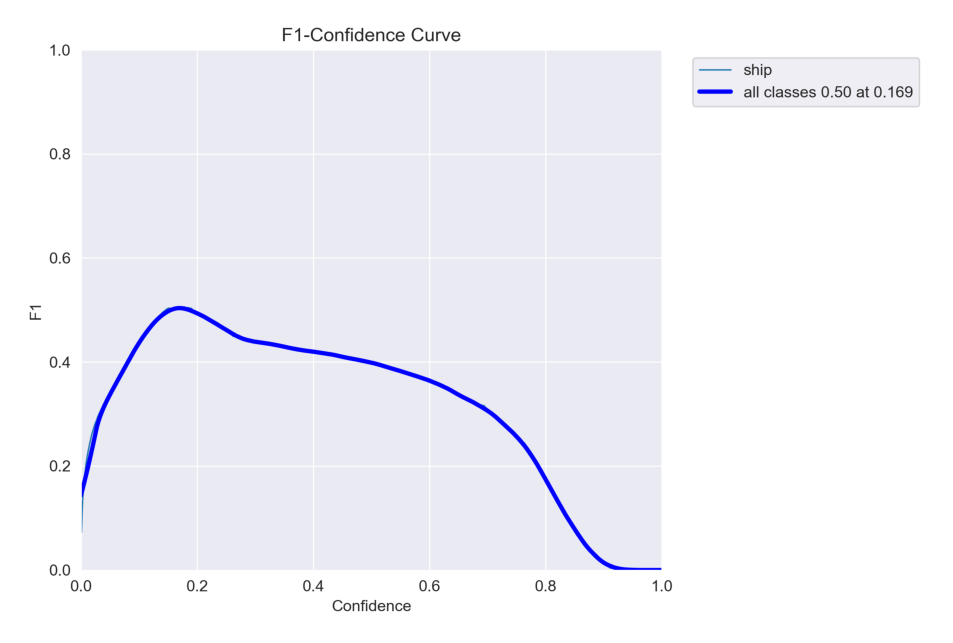

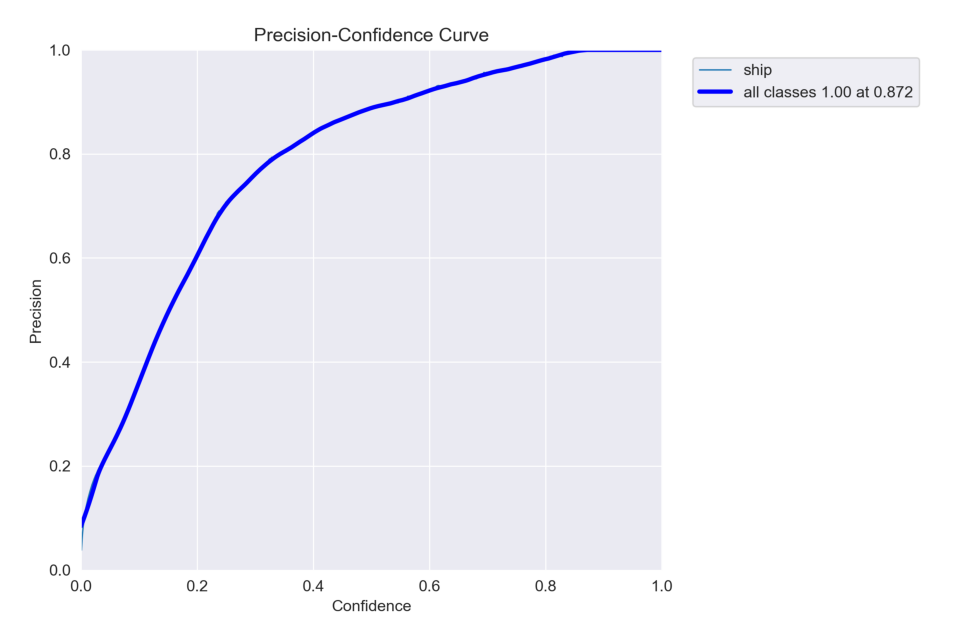

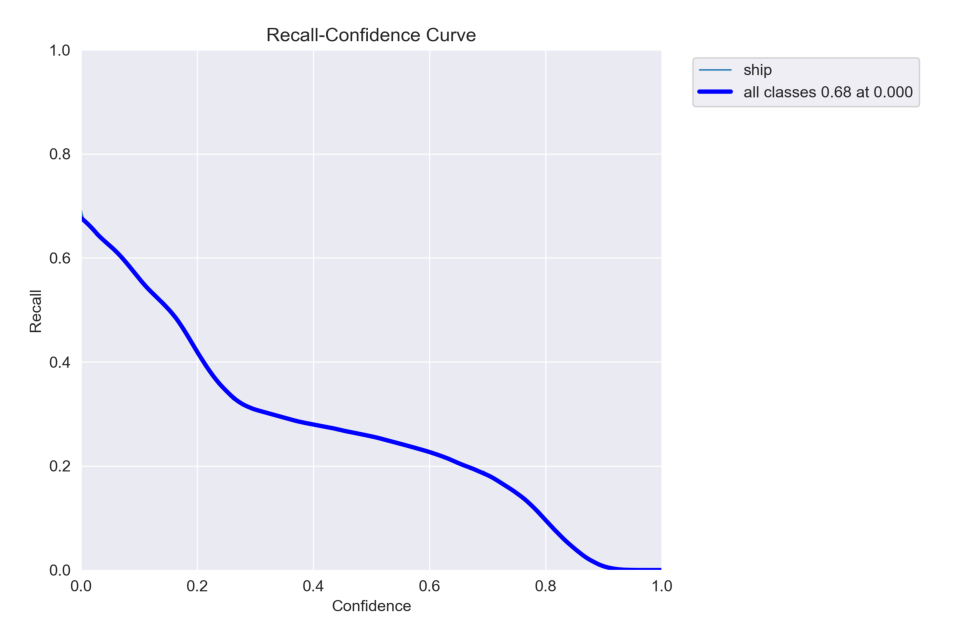

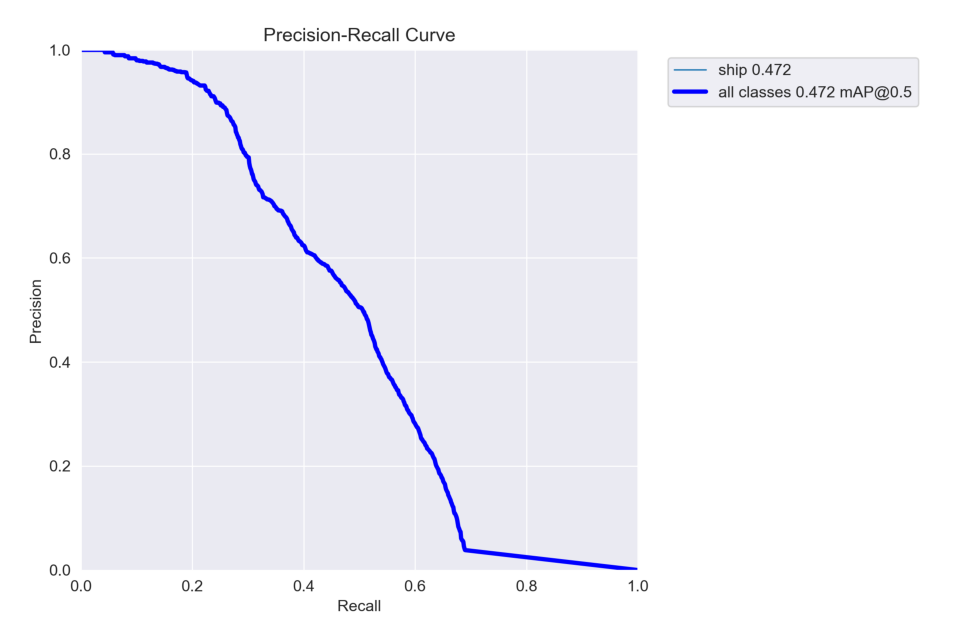

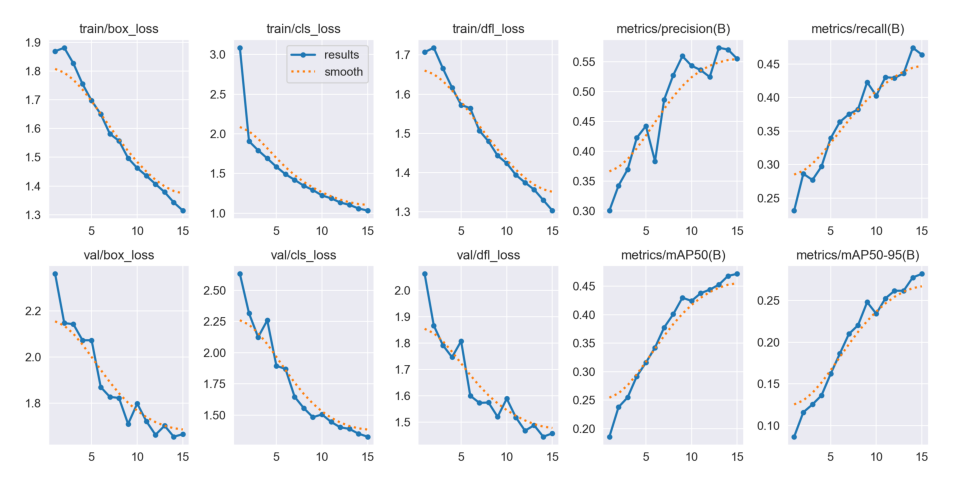

In [8]:
import os
import cv2
import matplotlib.pyplot as plt

def display_images(post_training_files_path, image_files):
    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        plt.figure(figsize=(10, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# 定義絕對路徑
post_training_files_path = r"D:\Code\anaconda\code\ship_yolo\runs\detect\train7"

image_files = [
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]

display_images(post_training_files_path, image_files)


In [4]:
%matplotlib inline
# Create the barplot
ax = sns.barplot(x=['mAP50-95', 'mAP50', 'mAP75'], y=[metrics.box.map, metrics.box.map50, metrics.box.map75])

ax.set_title('YOLO Evaluation Metrics')
ax.set_xlabel('Metric')
ax.set_ylabel('Value')

fig = plt.gcf()
fig.set_size_inches(8, 6)

for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')
    
plt.show()

NameError: name 'metrics' is not defined

In [8]:
model = YOLO('D:/Code/anaconda/code/ship_yolo/runs/detect/train7/weights/best.pt')


d:\anaconda\Lib\site-packages\ultralytics\nn\tasks.py:733: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(file, map_location="cpu")



image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\02e39612d_jpg.rf.cc5483bb711f080d12b644ff62cf977a.jpg: 768x768 1 ship, 23.7ms
Speed: 105.1ms preprocess, 23.7ms inference, 1225.2ms postprocess per image at shape (1, 3, 768, 768)


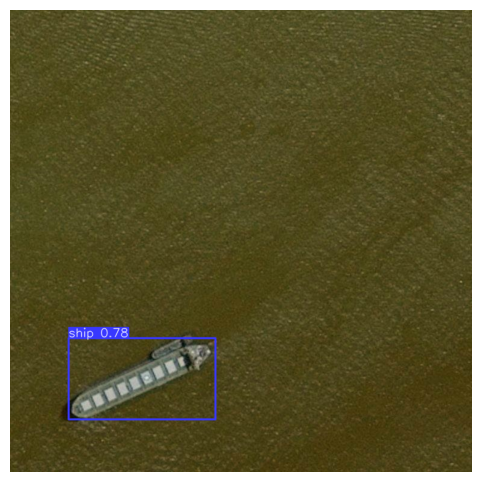


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\04-33800_jpg.rf.c45762dfac8f4c20534434159df41ad2.jpg: 768x768 (no detections), 149.2ms
Speed: 10.5ms preprocess, 149.2ms inference, 1.0ms postprocess per image at shape (1, 3, 768, 768)


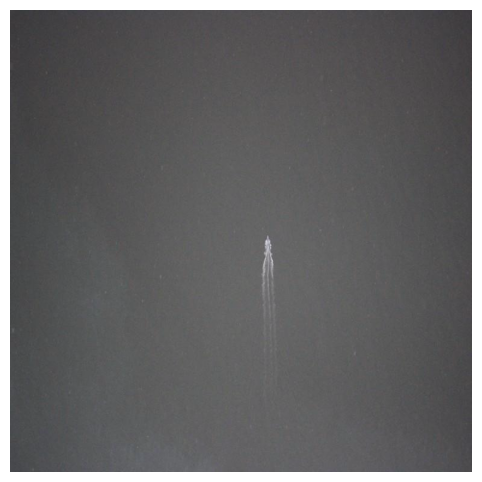


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\043d8815e_jpg.rf.702fa31e03a8a1c28e5fb63c561ac16e.jpg: 768x768 (no detections), 23.4ms
Speed: 3.0ms preprocess, 23.4ms inference, 1.1ms postprocess per image at shape (1, 3, 768, 768)


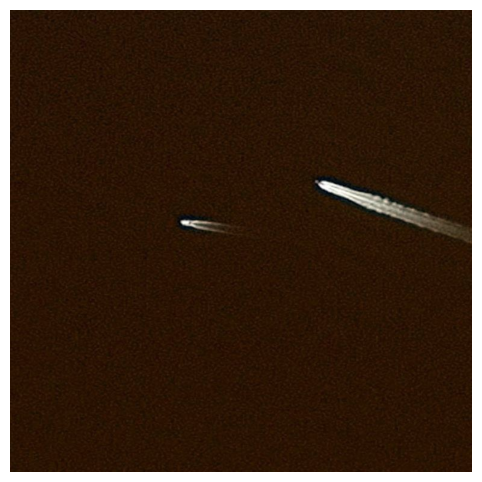


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\0573861e6_jpg.rf.1fad0872d11e88d7838f88d026832350.jpg: 768x768 (no detections), 22.6ms
Speed: 6.9ms preprocess, 22.6ms inference, 1.0ms postprocess per image at shape (1, 3, 768, 768)


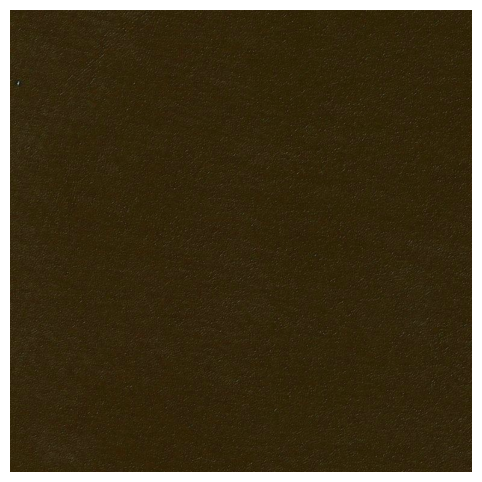


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\0cd8c51dd_jpg.rf.17db72d1f449d77200cb82e6b2b5fb9d.jpg: 768x768 1 ship, 23.9ms
Speed: 4.6ms preprocess, 23.9ms inference, 1.7ms postprocess per image at shape (1, 3, 768, 768)


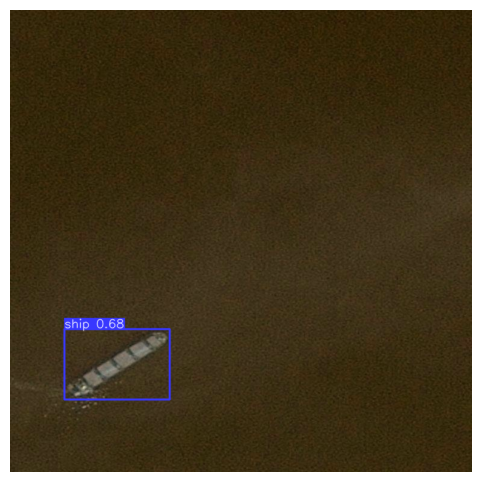


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\0f3d1a02e_jpg.rf.f2a15d7b7be50e9f729fe785320a1dd1.jpg: 768x768 (no detections), 23.2ms
Speed: 9.5ms preprocess, 23.2ms inference, 1.0ms postprocess per image at shape (1, 3, 768, 768)


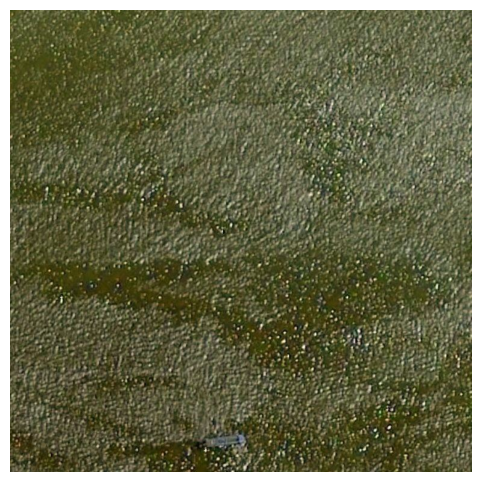


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\0__20160905_193458_0c37__-122-34588841807276_37-756417599310865_png.rf.82197eb6853000003827a752a1c02a47.jpg: 768x768 (no detections), 80.2ms
Speed: 71.6ms preprocess, 80.2ms inference, 36.6ms postprocess per image at shape (1, 3, 768, 768)


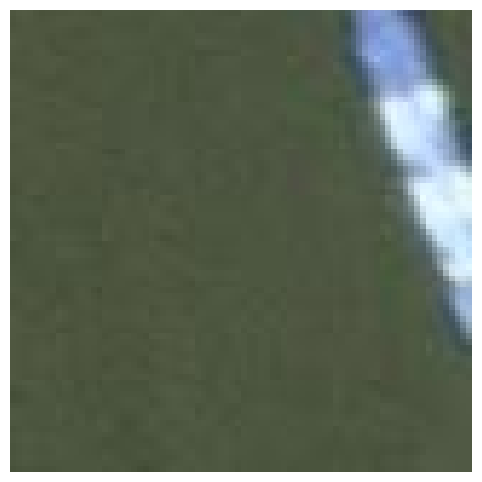


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\0__20161006_004004_0c38__-122-35115763991095_37-7692093023039_png.rf.038e071514696de42fd7fa870bc591b6.jpg: 768x768 (no detections), 29.4ms
Speed: 6.8ms preprocess, 29.4ms inference, 3.7ms postprocess per image at shape (1, 3, 768, 768)


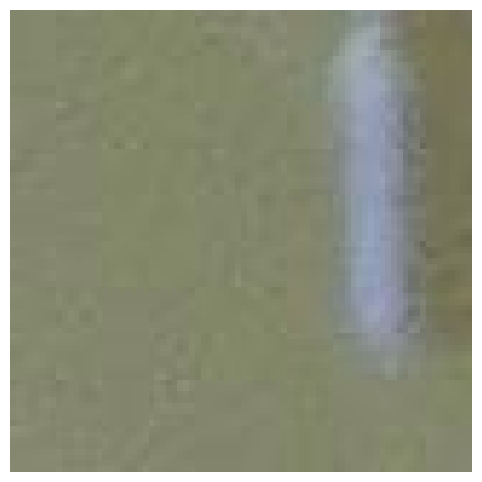


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\0__20161102_180658_0e26__-122-32843644745485_37-73923054907409_png.rf.7a1c9584c7dbbfbfae44014464239207.jpg: 768x768 1 ship, 53.6ms
Speed: 7.3ms preprocess, 53.6ms inference, 10.1ms postprocess per image at shape (1, 3, 768, 768)


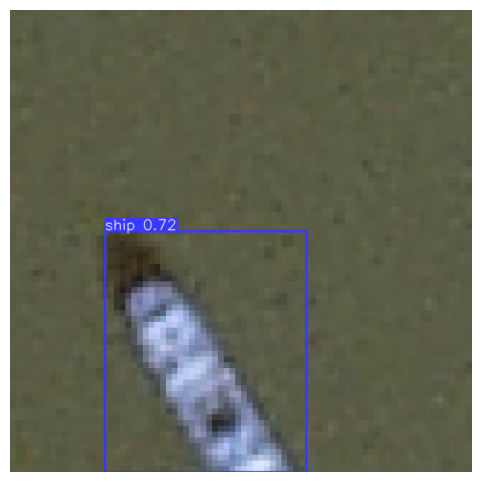


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\0__20161102_180658_0e26__-122-32843644745485_37-73923054907409_png.rf.eaa802fa2bec7639b5fc4c2ea9841a6d.jpg: 768x768 (no detections), 31.4ms
Speed: 6.4ms preprocess, 31.4ms inference, 0.5ms postprocess per image at shape (1, 3, 768, 768)


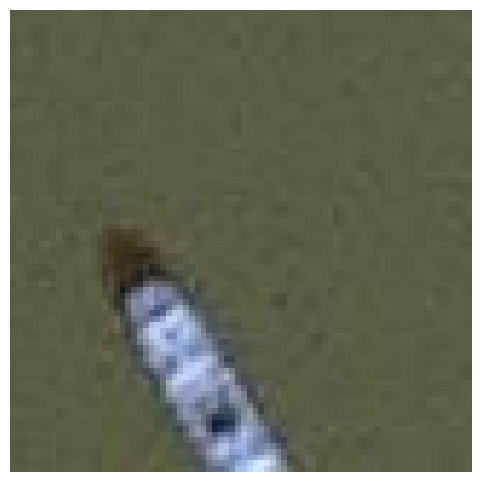


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\0__20161102_180658_0e26__-122-34040514248915_37-748761931300486_png.rf.36a27540d7f3580cbdbc5917ea6dbdc5.jpg: 768x768 (no detections), 30.5ms
Speed: 5.5ms preprocess, 30.5ms inference, 3.7ms postprocess per image at shape (1, 3, 768, 768)


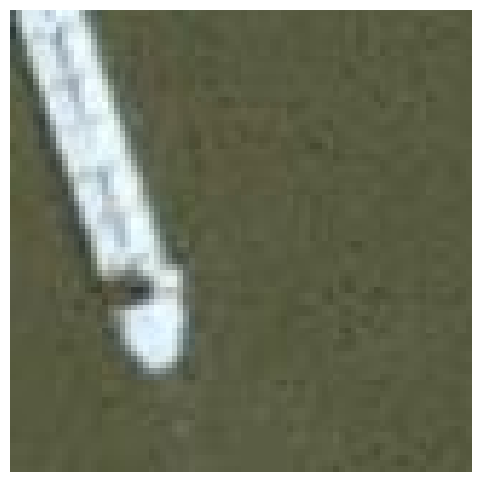


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\0__20161102_202001_0c75__-122-33669212065975_37-756528435140176_png.rf.7c6b3c902ee2874f57c92ff0984b3c3b.jpg: 768x768 (no detections), 39.2ms
Speed: 20.5ms preprocess, 39.2ms inference, 6.1ms postprocess per image at shape (1, 3, 768, 768)


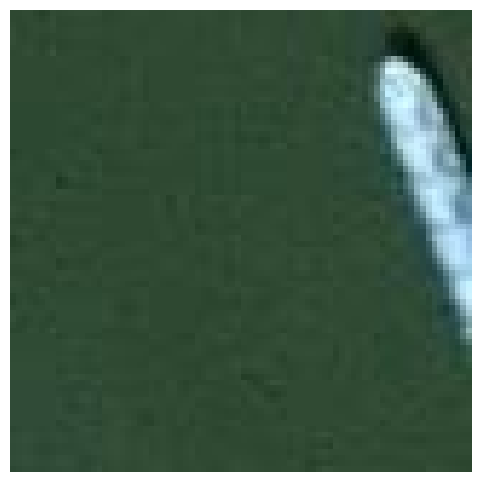


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\0__20161103_195523_0c27__-122-32811063986814_37-73760632632476_png.rf.f813612d65f137d904b255581efd6795.jpg: 768x768 (no detections), 31.8ms
Speed: 11.2ms preprocess, 31.8ms inference, 4.1ms postprocess per image at shape (1, 3, 768, 768)


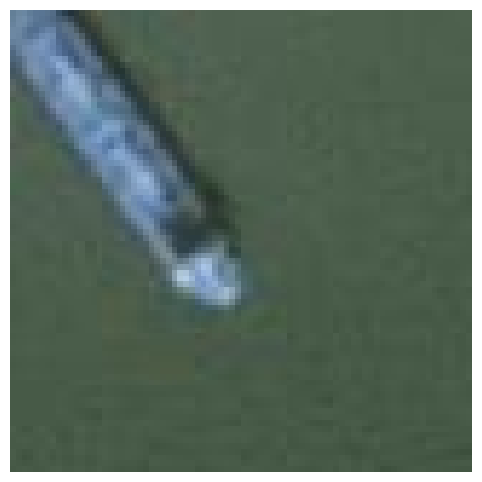


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\0__20161116_180803_0e14__-122-32415646123718_37-726876095974376_png.rf.0fd352d9abe5c02e1d24b9f67ee163c9.jpg: 768x768 1 ship, 47.8ms
Speed: 6.6ms preprocess, 47.8ms inference, 2.0ms postprocess per image at shape (1, 3, 768, 768)


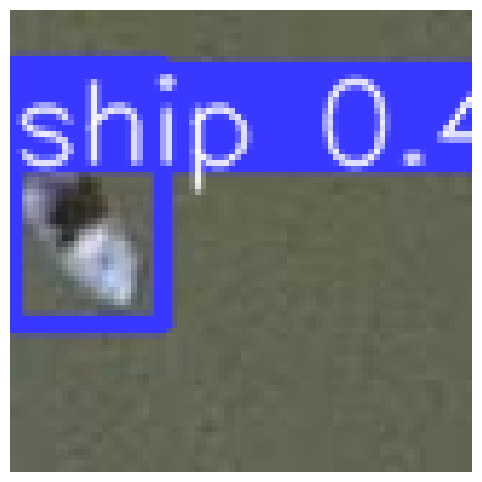


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\0__20170211_181116_0e16__-122-34955395727619_37-738402592072184_png.rf.624364914bb379c1e32b6dd767673e0f.jpg: 768x768 (no detections), 33.5ms
Speed: 5.0ms preprocess, 33.5ms inference, 7.4ms postprocess per image at shape (1, 3, 768, 768)


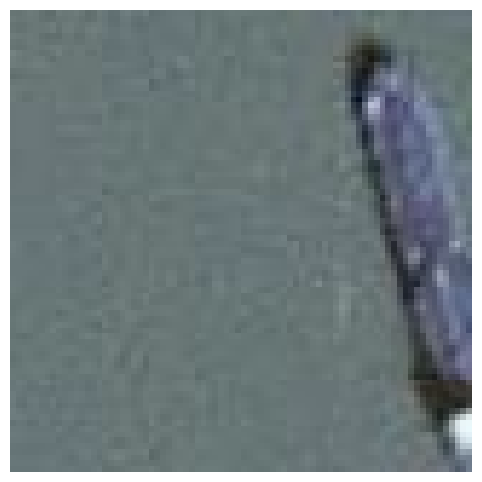


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\0__20170211_181116_0e16__-122-34955395727619_37-738402592072184_png.rf.63e39eb68d4b58d2275c2ba6cbe88790.jpg: 768x768 1 ship, 37.8ms
Speed: 6.0ms preprocess, 37.8ms inference, 5.2ms postprocess per image at shape (1, 3, 768, 768)


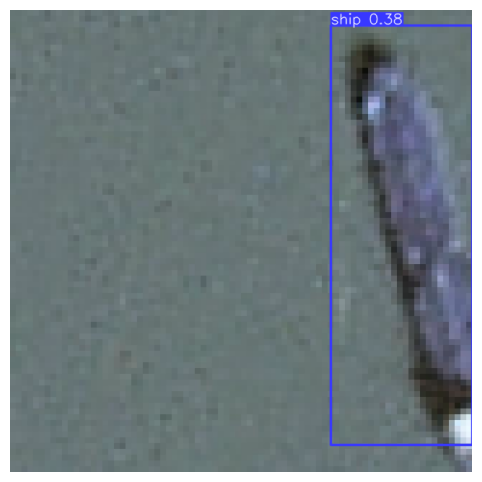


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\13-02100_jpg.rf.70684cbfac090ccdc3b7424de31ff811.jpg: 768x768 (no detections), 38.7ms
Speed: 14.3ms preprocess, 38.7ms inference, 0.0ms postprocess per image at shape (1, 3, 768, 768)


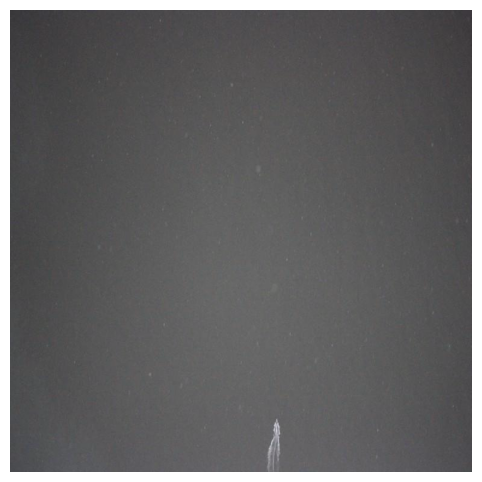


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\149061153_jpg.rf.b46bce51697ece3ee892f074ef0d16ca.jpg: 768x768 (no detections), 161.1ms
Speed: 8.3ms preprocess, 161.1ms inference, 1.0ms postprocess per image at shape (1, 3, 768, 768)


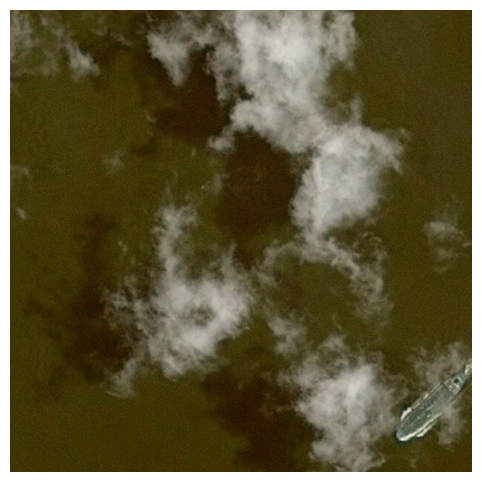


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\151e8d12d_jpg.rf.5b14dba4f8fa0e31f9b280158f70a364.jpg: 768x768 1 ship, 154.9ms
Speed: 6.6ms preprocess, 154.9ms inference, 3.0ms postprocess per image at shape (1, 3, 768, 768)


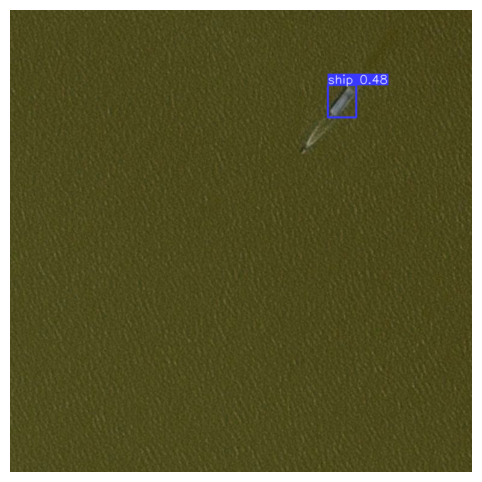


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\1a2eab42e_jpg.rf.f1f8d26bda5f2c194c48e538332da634.jpg: 768x768 (no detections), 26.0ms
Speed: 10.0ms preprocess, 26.0ms inference, 3.0ms postprocess per image at shape (1, 3, 768, 768)


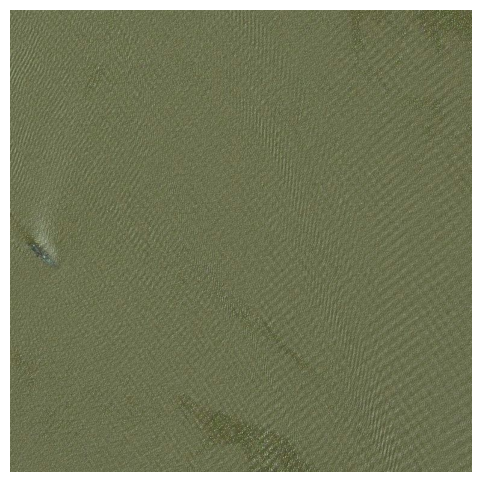


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\1b00afe9d_jpg.rf.f3b98d0c543aca3a9c6c5b7e40c0f222.jpg: 768x768 1 ship, 63.9ms
Speed: 9.7ms preprocess, 63.9ms inference, 12.4ms postprocess per image at shape (1, 3, 768, 768)


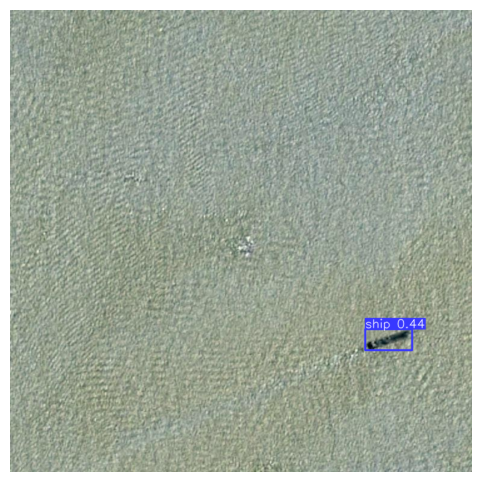


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\1f8b6650c_jpg.rf.2f6c610e2ad91d0bc71134043c532e0e.jpg: 768x768 (no detections), 156.8ms
Speed: 3.9ms preprocess, 156.8ms inference, 1.3ms postprocess per image at shape (1, 3, 768, 768)


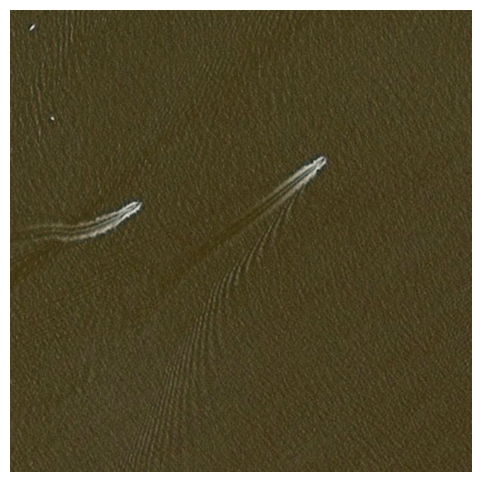


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\20210721_102725_39_2424_14_jpg.rf.2769b1d5f6d603ab8fd190108725cbcf.jpg: 608x768 (no detections), 316.2ms
Speed: 7.8ms preprocess, 316.2ms inference, 2.2ms postprocess per image at shape (1, 3, 608, 768)


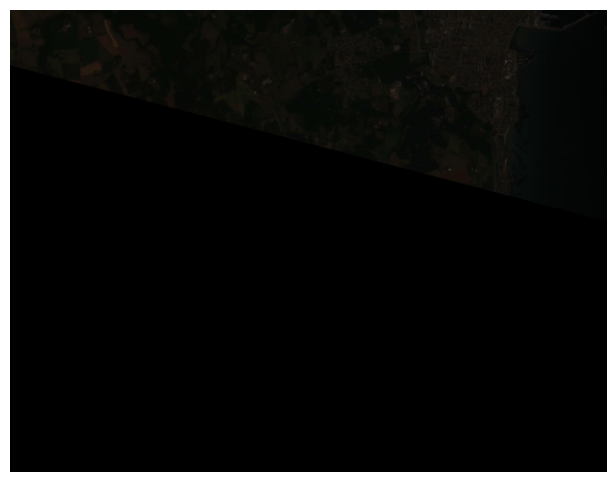


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\20210721_102725_39_2424_1_jpg.rf.368d8bf9bea3b1158bcacd4fc4240926.jpg: 608x768 (no detections), 115.6ms
Speed: 12.5ms preprocess, 115.6ms inference, 2.0ms postprocess per image at shape (1, 3, 608, 768)


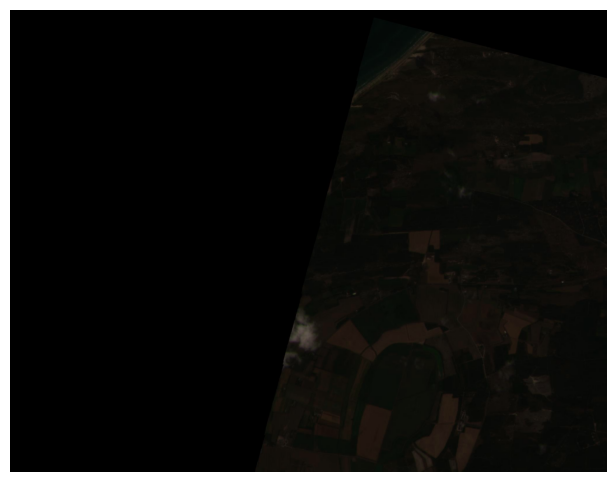


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\20210721_102725_39_2424_3_jpg.rf.0138548e957330a7451bae469670f719.jpg: 608x768 (no detections), 22.0ms
Speed: 10.0ms preprocess, 22.0ms inference, 2.0ms postprocess per image at shape (1, 3, 608, 768)


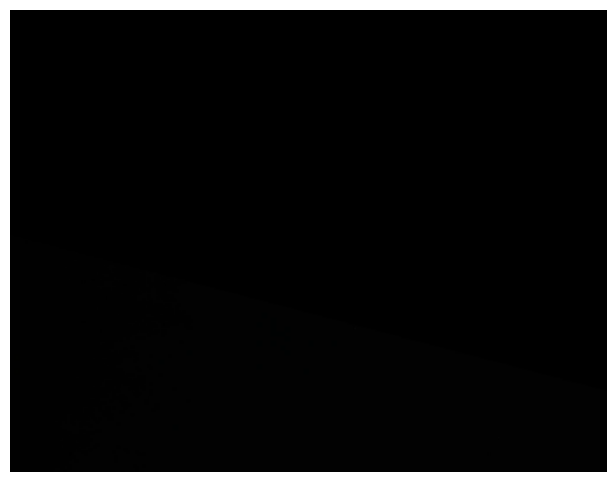


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\20210721_102725_39_2424_4_jpg.rf.5e4a9e7bc1223f25789d2908934a4391.jpg: 608x768 (no detections), 20.6ms
Speed: 16.2ms preprocess, 20.6ms inference, 1.3ms postprocess per image at shape (1, 3, 608, 768)


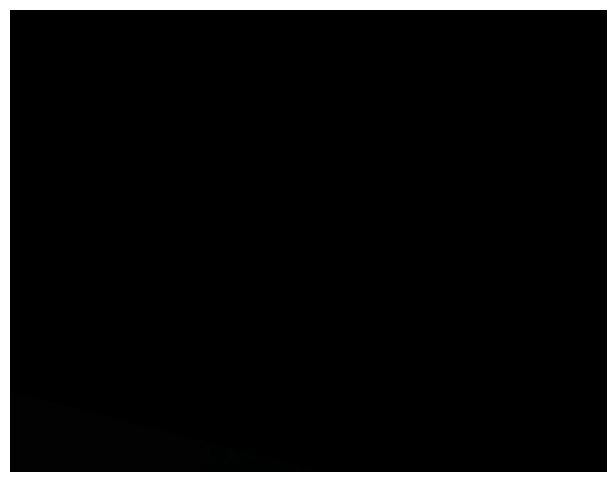


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\20210721_102725_39_2424_7_jpg.rf.43e9ee5196f159b983300e082c77bfc4.jpg: 608x768 (no detections), 63.3ms
Speed: 15.2ms preprocess, 63.3ms inference, 2.0ms postprocess per image at shape (1, 3, 608, 768)


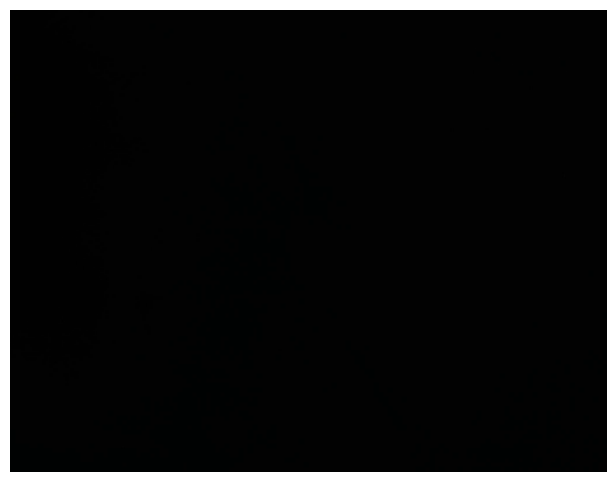


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\20210721_102725_39_2424_9_jpg.rf.7b04d412fe1b587021dc8e32ff09be2c.jpg: 608x768 (no detections), 123.4ms
Speed: 25.2ms preprocess, 123.4ms inference, 1.0ms postprocess per image at shape (1, 3, 608, 768)


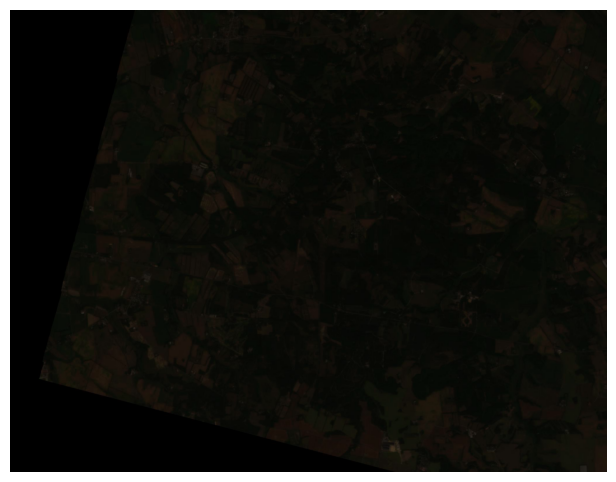


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\20210820_093900_64_2460_11_jpg.rf.7821456fa6b84ede4d57a781d935f3c5.jpg: 608x768 (no detections), 23.6ms
Speed: 10.8ms preprocess, 23.6ms inference, 1.0ms postprocess per image at shape (1, 3, 608, 768)


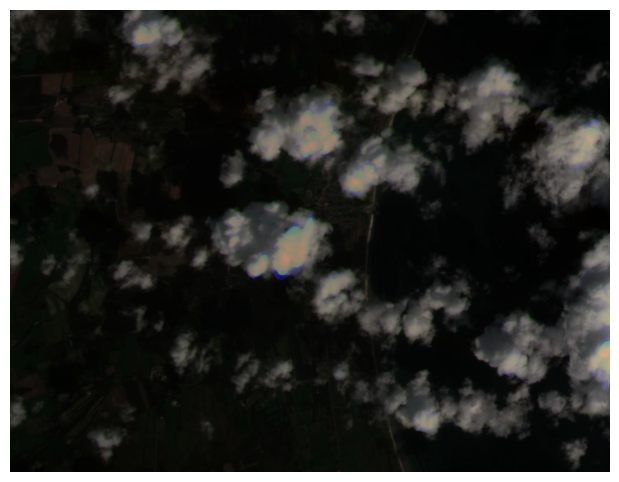


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\20210820_093900_64_2460_12_jpg.rf.cd1b4952df195d9c5b70cba45bb41e9d.jpg: 608x768 (no detections), 75.6ms
Speed: 14.5ms preprocess, 75.6ms inference, 1.0ms postprocess per image at shape (1, 3, 608, 768)


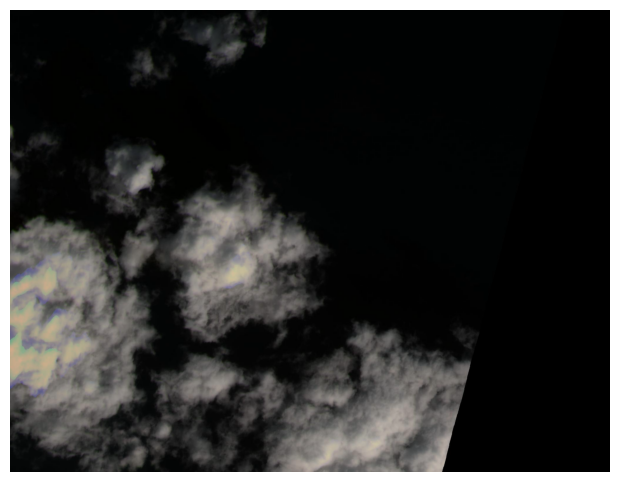


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\20210820_093900_64_2460_2_jpg.rf.ef9d5b71587499e147f15140f4a457f7.jpg: 608x768 1 ship, 23.4ms
Speed: 10.0ms preprocess, 23.4ms inference, 3.0ms postprocess per image at shape (1, 3, 608, 768)


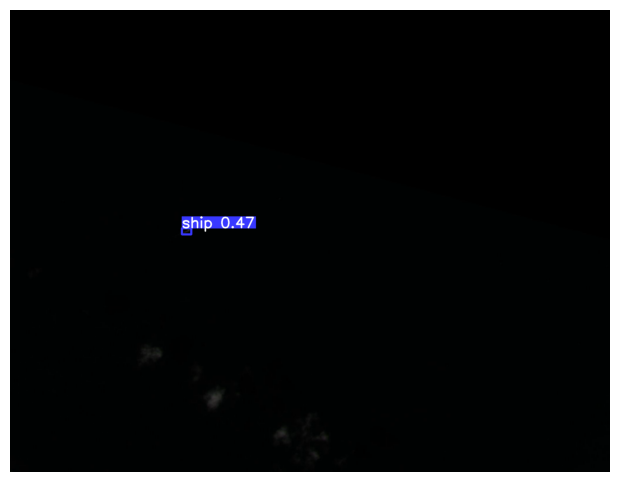


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\20210820_094301_59_2206_16_jpg.rf.2d2081e20c78fd3335864c77311ebd68.jpg: 576x768 (no detections), 152.8ms
Speed: 7.6ms preprocess, 152.8ms inference, 2.0ms postprocess per image at shape (1, 3, 576, 768)


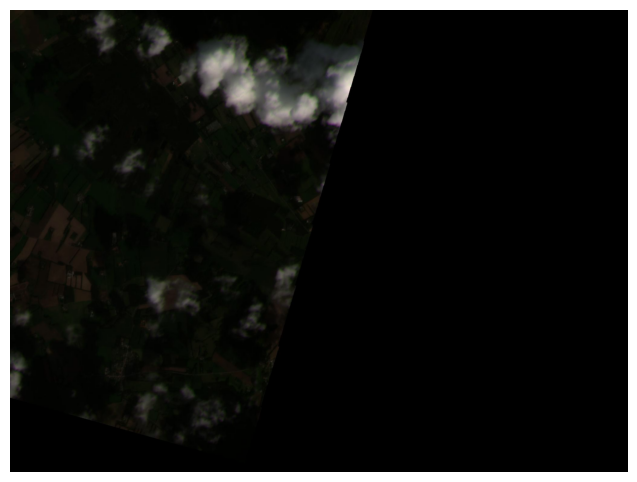


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\20210825_094043_91_245c_12_jpg.rf.658ec93ec37a9ee88453265994163092.jpg: 608x768 (no detections), 131.0ms
Speed: 9.6ms preprocess, 131.0ms inference, 0.0ms postprocess per image at shape (1, 3, 608, 768)


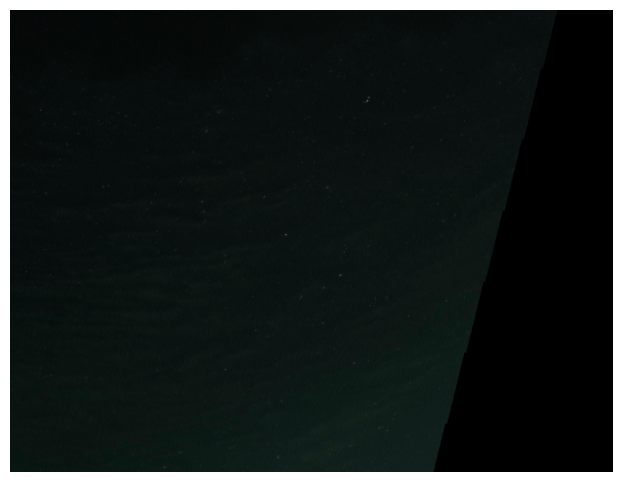


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\20210825_094043_91_245c_3_jpg.rf.5ad8277ac1c9bf6c7acb63a62f903a07.jpg: 608x768 (no detections), 17.2ms
Speed: 16.7ms preprocess, 17.2ms inference, 6.0ms postprocess per image at shape (1, 3, 608, 768)


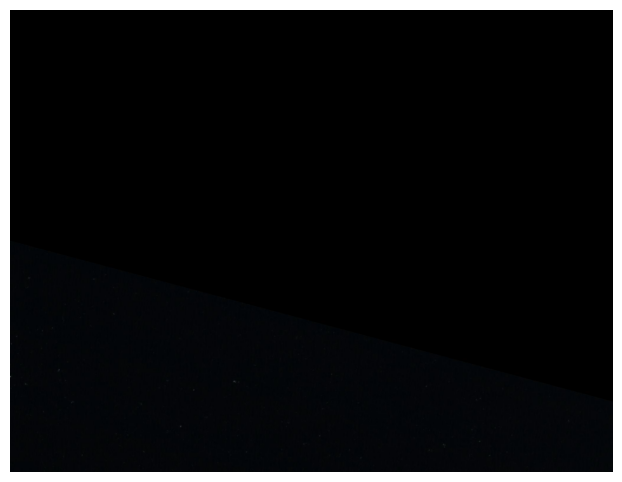


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\24d61fdda_jpg.rf.1518454df86bc76d2bbfc5e9f0e0bb5c.jpg: 768x768 1 ship, 39.0ms
Speed: 51.5ms preprocess, 39.0ms inference, 6.0ms postprocess per image at shape (1, 3, 768, 768)


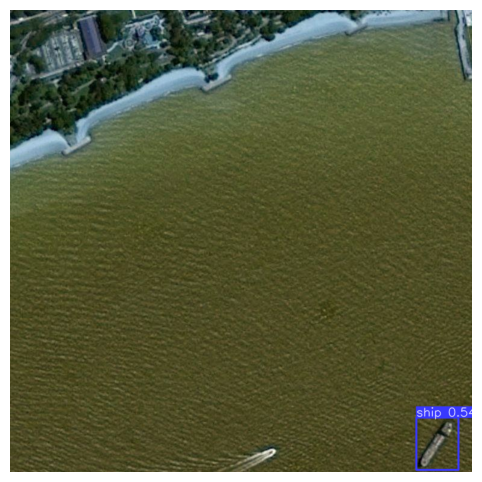


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\257b0cea8_jpg.rf.40d45ed9b991af77e6953e264f0bb2c2.jpg: 768x768 (no detections), 165.2ms
Speed: 7.3ms preprocess, 165.2ms inference, 2.0ms postprocess per image at shape (1, 3, 768, 768)


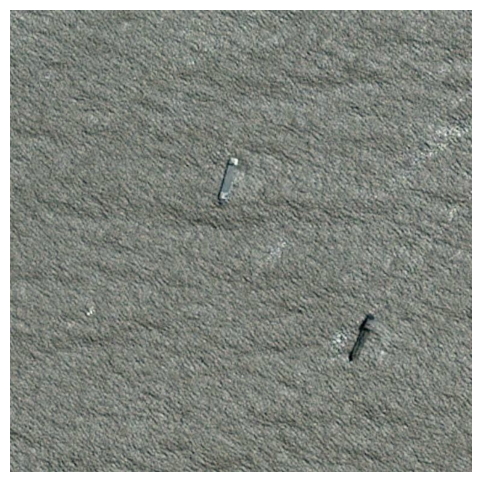


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\27befafef_jpg.rf.626926dff90bd5d7c527f66b59ef5cf0.jpg: 768x768 (no detections), 64.3ms
Speed: 83.0ms preprocess, 64.3ms inference, 1.0ms postprocess per image at shape (1, 3, 768, 768)


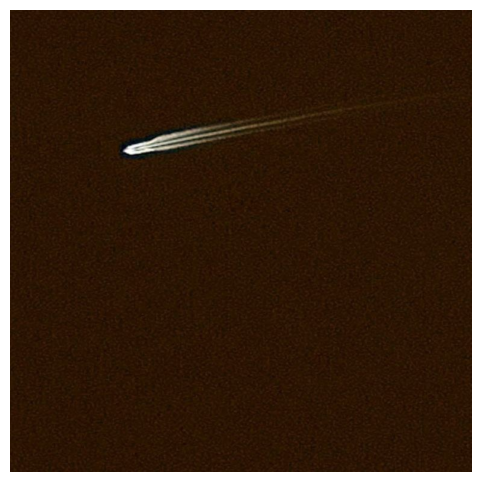


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\27f8e6ba0_jpg.rf.e0b9a59a991cf3f5369d34777c214c97.jpg: 768x768 1 ship, 21.5ms
Speed: 2.6ms preprocess, 21.5ms inference, 5.6ms postprocess per image at shape (1, 3, 768, 768)


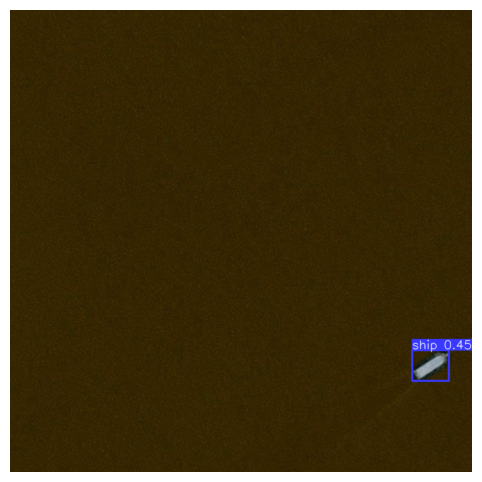


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\299e45e7e_jpg.rf.30d3023010b1ddf59530b829bfd3704d.jpg: 768x768 1 ship, 20.3ms
Speed: 3.6ms preprocess, 20.3ms inference, 13.0ms postprocess per image at shape (1, 3, 768, 768)


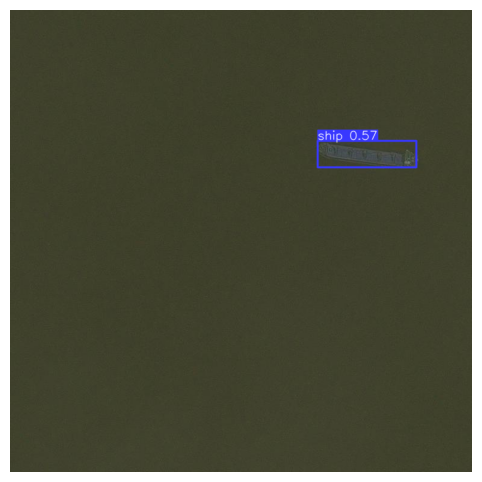


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\2e683a11c_jpg.rf.e9b3c84d77fecccbd7a46886c15e290d.jpg: 768x768 1 ship, 24.6ms
Speed: 5.8ms preprocess, 24.6ms inference, 8.1ms postprocess per image at shape (1, 3, 768, 768)


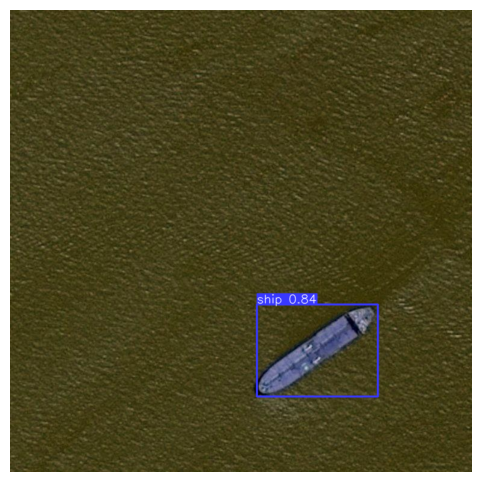


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\32ae0c592_jpg.rf.93b36584a1c82c66d535ccdf842ba4ba.jpg: 768x768 3 ships, 159.5ms
Speed: 9.4ms preprocess, 159.5ms inference, 0.0ms postprocess per image at shape (1, 3, 768, 768)


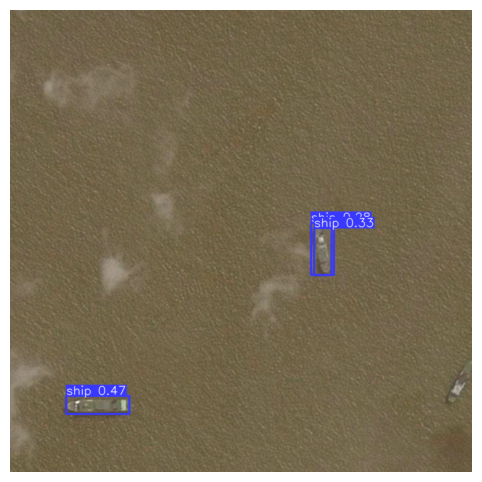


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\330bbcfe3_jpg.rf.15ebfc8692e02449e1678342db258458.jpg: 768x768 1 ship, 19.2ms
Speed: 5.3ms preprocess, 19.2ms inference, 4.5ms postprocess per image at shape (1, 3, 768, 768)


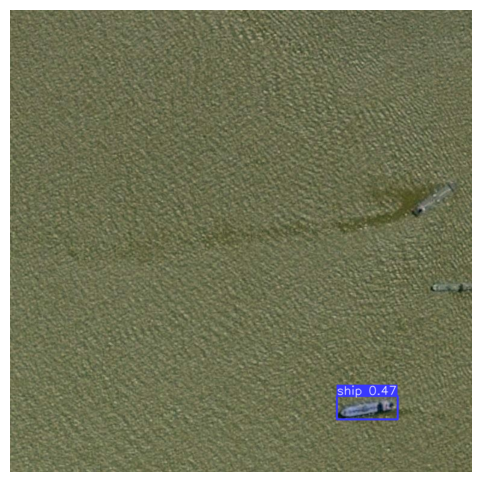


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\35e74684d_jpg.rf.f83022da7994b455b7c2dcc404ad029e.jpg: 768x768 (no detections), 18.9ms
Speed: 6.6ms preprocess, 18.9ms inference, 30.9ms postprocess per image at shape (1, 3, 768, 768)


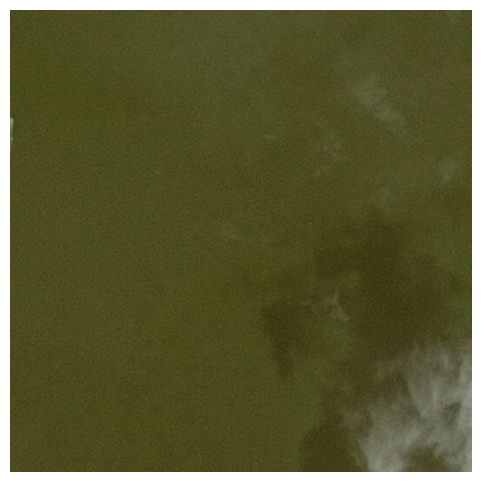


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\36149be42_jpg.rf.6d438319604841b21c7f19064f7b3bd1.jpg: 768x768 6 ships, 20.9ms
Speed: 4.4ms preprocess, 20.9ms inference, 162.3ms postprocess per image at shape (1, 3, 768, 768)


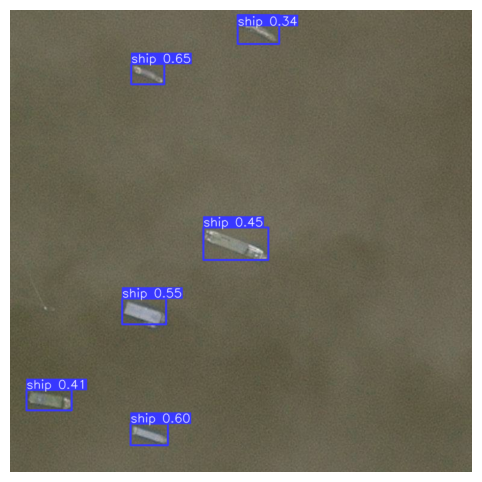


image 1/1 D:\Code\anaconda\code\ship_yolo\ships-aerial-images\test\images\3662196d2_jpg.rf.3721f4844732a351b1637d37747bbe96.jpg: 768x768 4 ships, 28.1ms
Speed: 7.5ms preprocess, 28.1ms inference, 72.3ms postprocess per image at shape (1, 3, 768, 768)


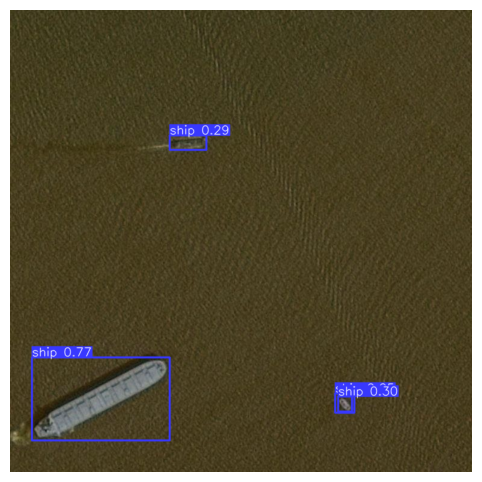

In [9]:
image_dir = "D:/Code/anaconda/code/ship_yolo/ships-aerial-images/test/images"

all_images = os.listdir(image_dir)
selected_images = all_images[:45]

for img_name in selected_images:
    img_path = os.path.join(image_dir, img_name) 
    results = model.predict(img_path)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  
    for result in results:
        plotted_img = result.plot()
        plt.figure(figsize=(8, 6))  
        plt.imshow(plotted_img)    
        plt.axis('off')             
        plt.show() 
